<a href="https://colab.research.google.com/github/soulqan/PCVK_GANJIL_2025/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum D1


In [4]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 50


/tmp/ipython-input-1066879811.py:15: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)


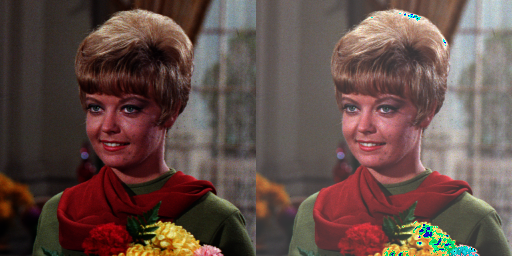

In [5]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)


final_frame = cv.hconcat([original, brightness_image])
cv2_imshow(final_frame)



**Tugas** **Praktikum** **D1**

Inverse Citra
----------------------------------


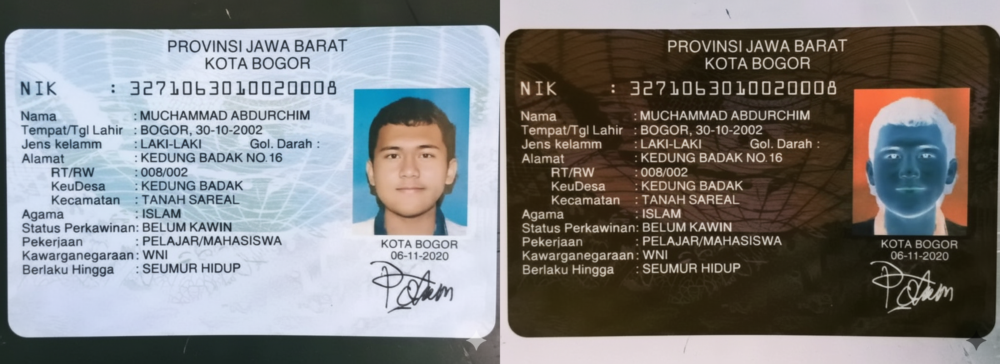

In [19]:
print('Inverse Citra')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')

# g(x,y) = 255 - f(x,y)
inverse_img = 255 - original

final_frame = cv.hconcat([original, inverse_img])
cv2_imshow(final_frame)


mengubah kontras dan tingkat kecerahan citra
----------------------------------
Masukkan nilai kecerahan (-255 sampai 255): 50
Masukkan nilai kontras (1.0 - 3.0): 2


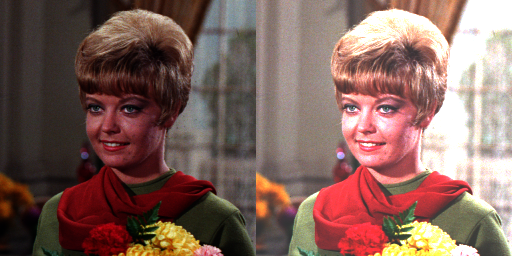

In [23]:
print('mengubah kontras dan tingkat kecerahan citra')
print('----------------------------------')
original = cv.imread('/content/drive/MyDrive/images/female.tiff')
try:
    brightness = int(input('Masukkan nilai kecerahan (-255 sampai 255): '))
    contrast = float(input('Masukkan nilai kontras (1.0 - 3.0): '))

except ValueError:
    print('Error, input bukan angka')

contrast = max(1.0, min(contrast, 3.0))
brightness = max(-255, min(brightness, 255))

contrast_bright_img = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            new_val = contrast * original[y, x, c] + brightness
            contrast_bright_img[y, x, c] = np.clip(new_val, 0, 255)

final_frame = cv.hconcat([original, contrast_bright_img])
cv2_imshow(final_frame)


Mengubah tingkat kecerahan citra dengan transformasi log
----------------------------------
Masukkan nilai kecerahan: 50


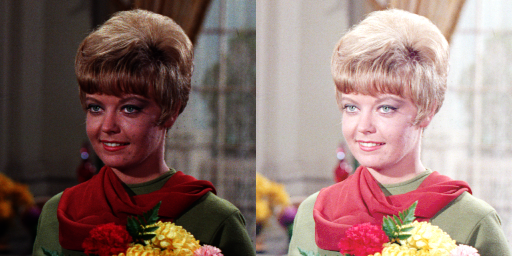

In [25]:
print('Mengubah tingkat kecerahan citra dengan transformasi log')
print('----------------------------------')

try:
    c = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, input bukan angka')
    c = 30

log_img = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):
            new_val = c * np.log1p(original[y, x, ch])
            log_img[y, x, ch] = np.clip(new_val, 0, 255)

final_frame = cv.hconcat([original, log_img])
cv2_imshow(final_frame)


D1.4.a – Grayscale Averaging
----------------------------------


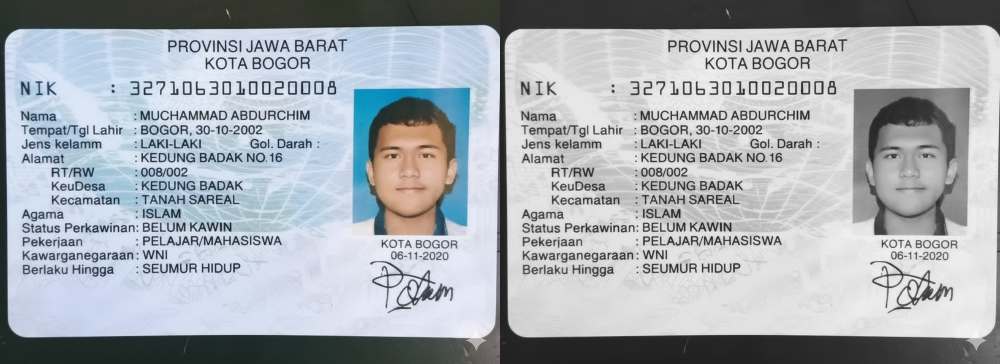

In [28]:
print('D1.4.a – Grayscale Averaging')
print('----------------------------------')
original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')
gray_avg = np.mean(original, axis=2).astype(np.uint8)
gray_avg_bgr = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original, gray_avg_bgr])
cv2_imshow(final_frame)


D1.4.b – Grayscale Lightness
----------------------------------


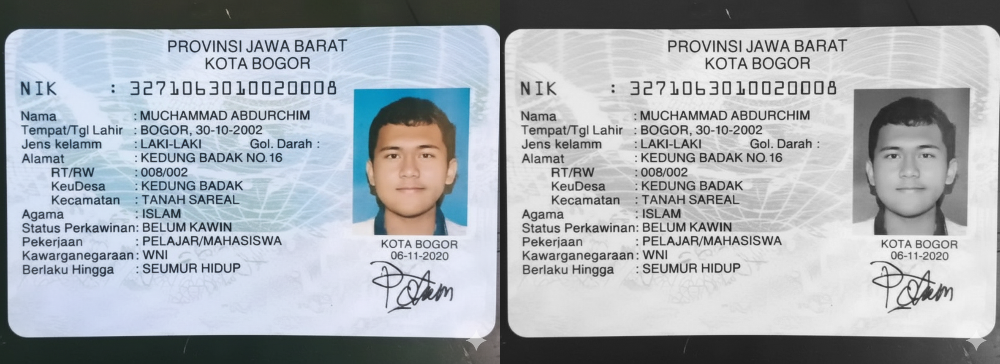

In [37]:
print('D1.4.b – Grayscale Lightness')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')

B = original[:,:,0]
G = original[:,:,1]
R = original[:,:,2]

maxc = np.maximum(np.maximum(R, G), B)
minc = np.minimum(np.minimum(R, G), B)
gray_light = ((maxc.astype(np.float32) + minc.astype(np.float32)) / 2).astype(np.uint8)

gray_light_bgr = cv.cvtColor(gray_light, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original, gray_light_bgr])
cv2_imshow(final_frame)


D1.4.c – Grayscale Luminance
----------------------------------


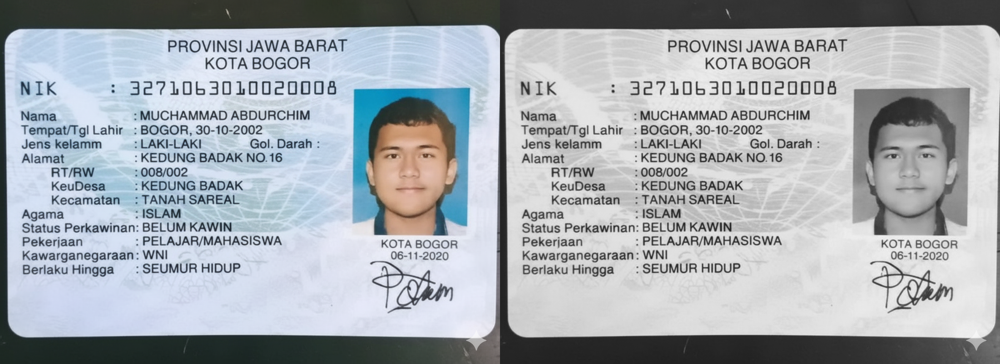

In [33]:
print('D1.4.c – Grayscale Luminance')
print('----------------------------------')

gray_lum = (0.21*original[:,:,2] + 0.72*original[:,:,1] + 0.07*original[:,:,0]).astype(np.uint8)
gray_lum_bgr = cv.cvtColor(gray_lum, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original, gray_lum_bgr])
cv2_imshow(final_frame)



D1.5 – Menampilkan Warna Biru, Sisanya Grayscale
----------------------------------


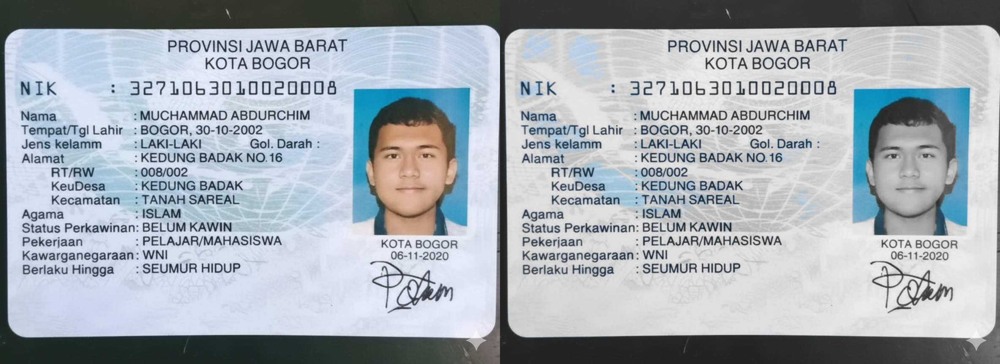

In [40]:
print('D1.5 – Menampilkan Warna Biru, Sisanya Grayscale')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')

hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

lower_blue = np.array([90, 50, 50])
upper_blue = np.array([130, 255, 255])

mask = cv.inRange(hsv, lower_blue, upper_blue)

gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

result = gray_bgr.copy()
result[mask > 0] = original[mask > 0]

final_frame = cv.hconcat([original, result])
cv2_imshow(final_frame)


#Praktikum D2


In [ ]:
import matplotlib.pyplot as plt

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 3


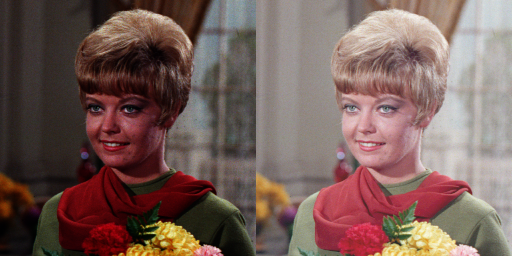

In [43]:
print('Gamma Correction pada citra')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/images/female.tiff')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, input bukan angka')
    gamma = 1.0

inv_gamma = 1.0 / gamma
table = np.array([( (i/255.0) ** inv_gamma ) * 255 for i in np.arange(256)]).astype("uint8")
gamma_img = cv.LUT(original, table)

final_frame = cv.hconcat([original, gamma_img])
cv2_imshow(final_frame)


Simulasi Bit Depth
----------------------------------
Masukkan nilai bit depth (1–7): 5


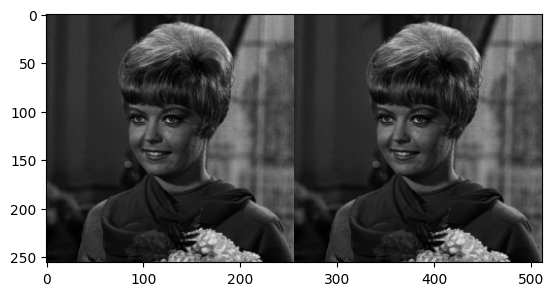

In [48]:
print('Simulasi Bit Depth')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/images/female.tiff', cv.IMREAD_GRAYSCALE)

try:
    bit_depth = int(input('Masukkan nilai bit depth (1–7): '))
except ValueError:
    print('Error, input bukan angka')
    bit_depth = 4

level = 255 / (pow(2, bit_depth) - 1)
depth_image = np.round((original/level) * level).astype(np.uint8)

original_bgr = cv.cvtColor(original, cv.COLOR_GRAY2BGR)
depth_bgr = cv.cvtColor(depth_image, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original_bgr, depth_bgr])
plt.imshow(final_frame)


Average Denoising + PSNR
----------------------------------
Jumlah 10 citra, PSNR = 27.55 dB


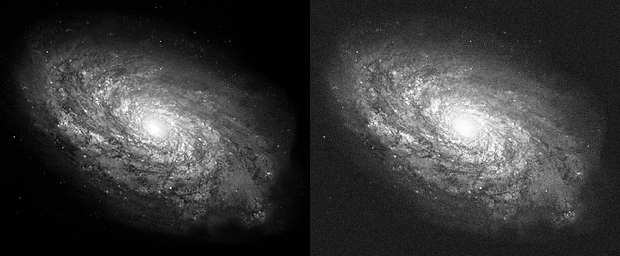

Jumlah 20 citra, PSNR = 27.55 dB


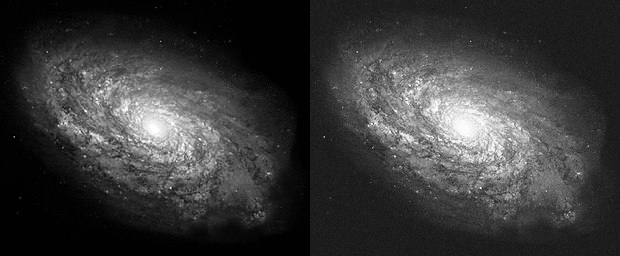

Jumlah 40 citra, PSNR = 27.45 dB


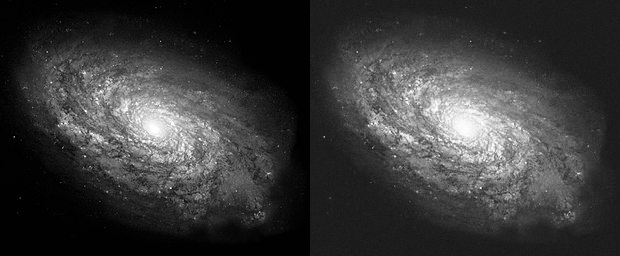

Jumlah 80 citra, PSNR = 27.39 dB


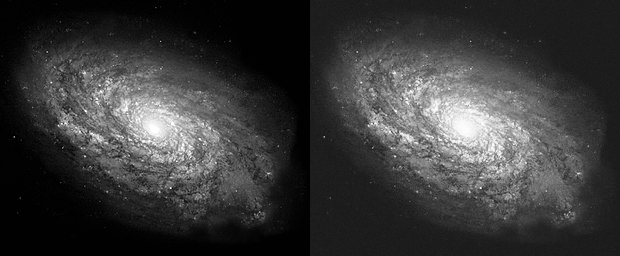

Jumlah 100 citra, PSNR = 27.36 dB


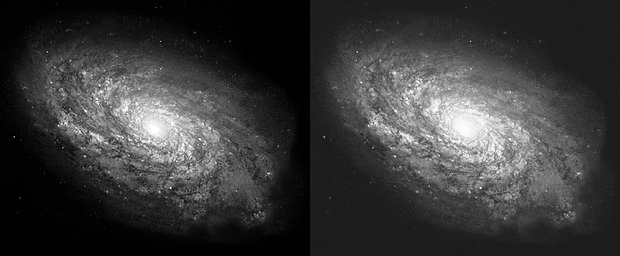

In [7]:
print('Average Denoising + PSNR')
print('----------------------------------')

from math import log10, sqrt
import glob

def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    return 20 * log10(max_pixel / sqrt(mse))

original = cv.imread('/content/drive/MyDrive/images/galaxy.jpg', cv.IMREAD_GRAYSCALE)

cv_img = []
for path in glob.glob('/content/drive/MyDrive/images/noises/*.jpg'):
    n = cv.imread(path, cv.IMREAD_GRAYSCALE)
    cv_img.append(n)

def average_images(images, n):
    avg = np.zeros(images[0].shape, np.float32)
    for i in range(n):
        avg += images[i].astype(np.float32)
    avg /= n
    return avg.astype(np.uint8)

for n in [10, 20, 40, 80, 100]:
    avg_img = average_images(cv_img, n)
    psnr_val = PSNR(original, avg_img)
    print(f"Jumlah {n} citra, PSNR = {psnr_val:.2f} dB")
    final_frame = cv.hconcat([original, avg_img])
    cv2_imshow(final_frame)
